<a href="https://www.kaggle.com/code/lalit7881/global-employment-trends-v1?scriptVersionId=305737066" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/algozee/global123445/disoccupazione.csv
/kaggle/input/datasets/algozee/global123445/occupazione.csv


## Loading dataset

In [2]:
df = pd.read_csv("/kaggle/input/datasets/algozee/global123445/occupazione.csv")

In [3]:
df.head()

,iso_code,country,sex,age,year,obs_value
0,AFG,Afghanistan,Total,15+,2025,32.457
1,AFG,Afghanistan,Total,15-24,2025,31.419
2,AFG,Afghanistan,Total,25+,2025,33.056
3,AFG,Afghanistan,Male,15+,2025,61.038
4,AFG,Afghanistan,Male,15-24,2025,57.355


In [4]:
df.tail()

,iso_code,country,sex,age,year,obs_value
57514,ZWE,Zimbabwe,Male,15-24,1991,56.380
57515,ZWE,Zimbabwe,Male,25+,1991,79.360
57516,ZWE,Zimbabwe,Female,15+,1991,57.601
57517,ZWE,Zimbabwe,Female,15-24,1991,45.019
57518,ZWE,Zimbabwe,Female,25+,1991,65.530


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57519 entries, 0 to 57518
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   iso_code   57519 non-null  object 
 1   country    57519 non-null  object 
 2   sex        57519 non-null  object 
 3   age        57519 non-null  object 
 4   year       57519 non-null  int64  
 5   obs_value  57519 non-null  float64
dtypes: float64(1), int64(1), object(4)
memory usage: 2.6+ MB


In [6]:
df.describe()

,year,obs_value
count,57519.000000,57519.000000
mean,2007.964951,52.646644
std,10.082723,19.731751
min,1991.000000,1.741000
25%,1999.000000,38.745000
50%,2008.000000,54.160000
75%,2017.000000,67.203500
max,2025.000000,98.535000


In [7]:
df.isnull().sum()

iso_code     0
country      0
sex          0
age          0
year         0
obs_value    0
dtype: int64

In [8]:
df.duplicated().sum()

np.int64(0)

In [9]:
df.dtypes

iso_code      object
country       object
sex           object
age           object
year           int64
obs_value    float64
dtype: object

In [10]:
df.shape

(57519, 6)

In [11]:
df.columns

Index(['iso_code', 'country', 'sex', 'age', 'year', 'obs_value'], dtype='object')

In [12]:
df.nunique()

iso_code       183
country        183
sex              3
age              3
year            35
obs_value    39986
dtype: int64

## EDA

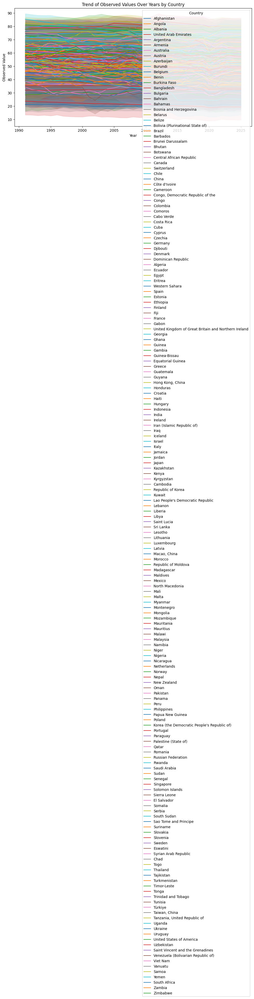

In [13]:
plt.figure(figsize=(12,6))

sns.lineplot(
    data=df,
    x="year",
    y="obs_value",
    hue="country",
    palette="tab10"
)

plt.title("Trend of Observed Values Over Years by Country")
plt.xlabel("Year")
plt.ylabel("Observed Value")
plt.legend(title="Country")
plt.show()

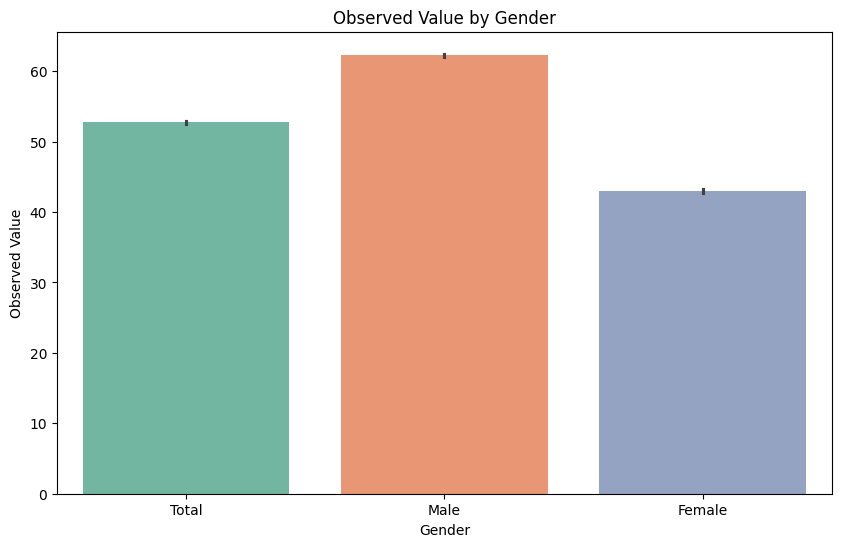

In [14]:
plt.figure(figsize=(10,6))

sns.barplot(
    data=df,
    x="sex",
    y="obs_value",
    hue="sex",
    palette="Set2"
)

plt.title("Observed Value by Gender")
plt.xlabel("Gender")
plt.ylabel("Observed Value")
plt.show()

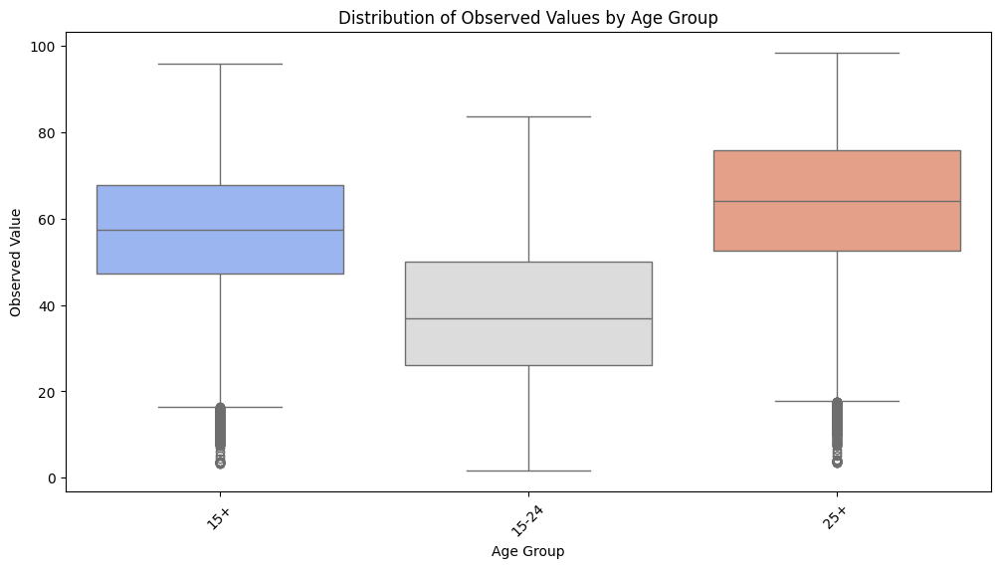

In [15]:
plt.figure(figsize=(12,6))

sns.boxplot(
    data=df,
    x="age",
    y="obs_value",
    palette="coolwarm"
)

plt.title("Distribution of Observed Values by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Observed Value")
plt.xticks(rotation=45)
plt.show()

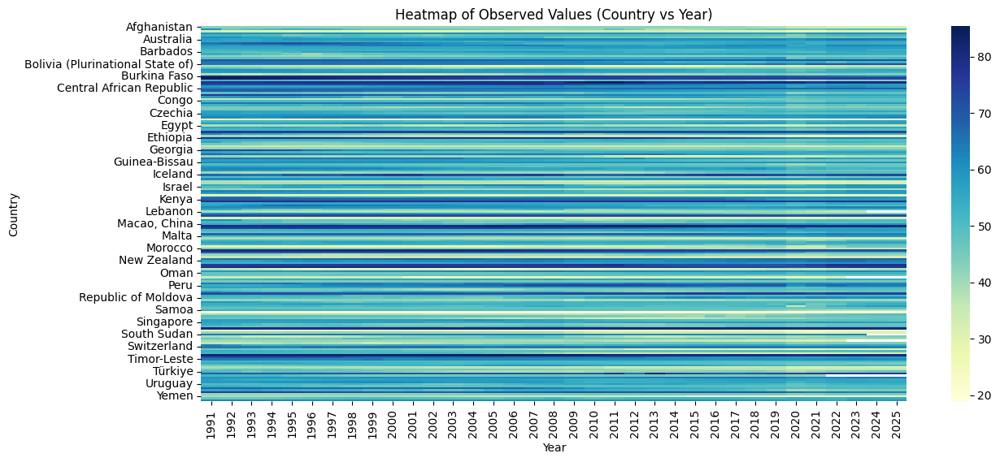

In [16]:
pivot = df.pivot_table(
    values="obs_value",
    index="country",
    columns="year"
)

plt.figure(figsize=(14,6))

sns.heatmap(
    pivot,
    cmap="YlGnBu",
    annot=False
)

plt.title("Heatmap of Observed Values (Country vs Year)")
plt.xlabel("Year")
plt.ylabel("Country")
plt.show()

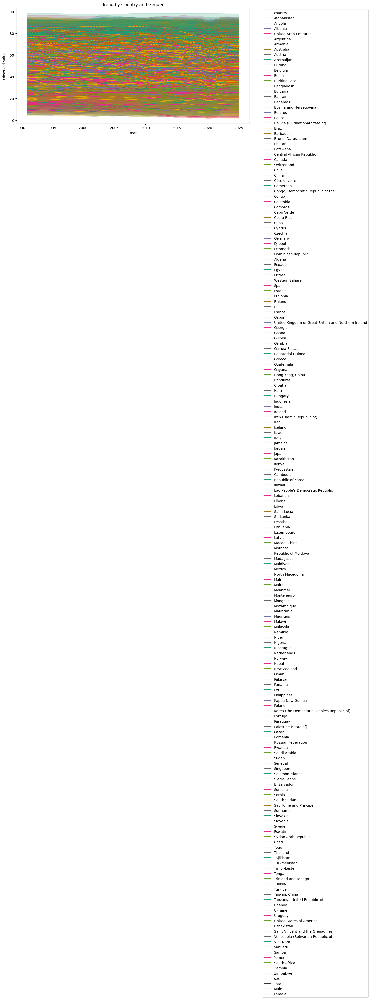

In [17]:
plt.figure(figsize=(12,6))

sns.lineplot(
    data=df,
    x="year",
    y="obs_value",
    hue="country",
    style="sex",
    palette="Dark2"
)

plt.title("Trend by Country and Gender")
plt.xlabel("Year")
plt.ylabel("Observed Value")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

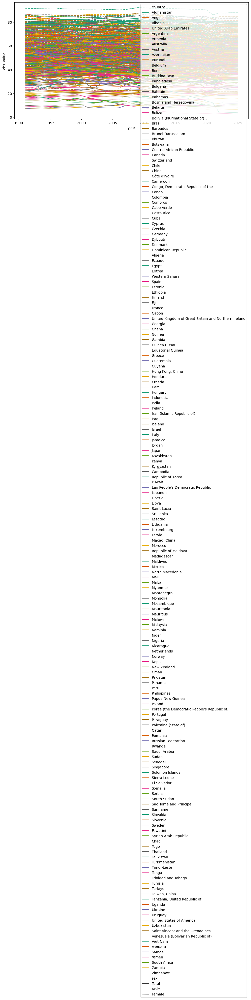

In [18]:
plt.figure(figsize=(12,6))

sns.lineplot(
    data=df,
    x="year",
    y="obs_value",
    hue="country",
    style="sex",
    palette="Dark2",
    errorbar=None   # 🔥 important (new seaborn)
)

plt.show()

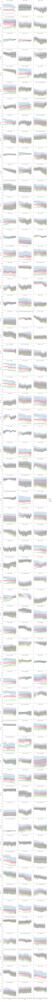

In [19]:
g = sns.FacetGrid(
    df,
    col="country",
    hue="sex",
    col_wrap=3,
    height=4,
    palette="Set1"
)

g.map(sns.lineplot, "year", "obs_value")
g.add_legend()

plt.show()

## Feature engineering

In [20]:
# Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

# Metrics
from sklearn.metrics import accuracy_score, roc_curve, auc

In [21]:
# Create binary target (1 = high, 0 = low)
threshold = df['obs_value'].median()

df['target'] = (df['obs_value'] > threshold).astype(int)

In [22]:
X = df[['iso_code', 'country', 'sex', 'age', 'year']]
y = df['target']

In [23]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [24]:
categorical_cols = ['iso_code', 'country', 'sex', 'age']

encoders = {}

for col in categorical_cols:
    le = LabelEncoder()
    
    X_train[col] = le.fit_transform(X_train[col])
    X_test[col] = le.transform(X_test[col])  # use SAME encoder
    
    encoders[col] = le

In [25]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [26]:
models = {
    "Logistic Regression": LogisticRegression(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier()
}

results = {}

Logistic Regression Accuracy: 0.5859
Decision Tree Accuracy: 0.9790
Random Forest Accuracy: 0.9766


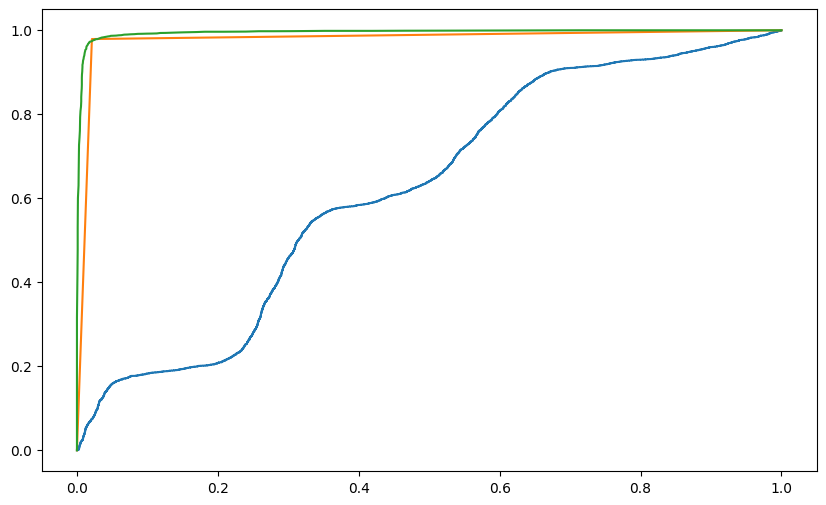

In [27]:
plt.figure(figsize=(10,6))

for name, model in models.items():
    # Train
    model.fit(X_train, y_train)
    
    # Predictions
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]
    
    # Accuracy
    acc = accuracy_score(y_test, y_pred)
    results[name] = acc
    print(f"{name} Accuracy: {acc:.4f}")
    
    # ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")

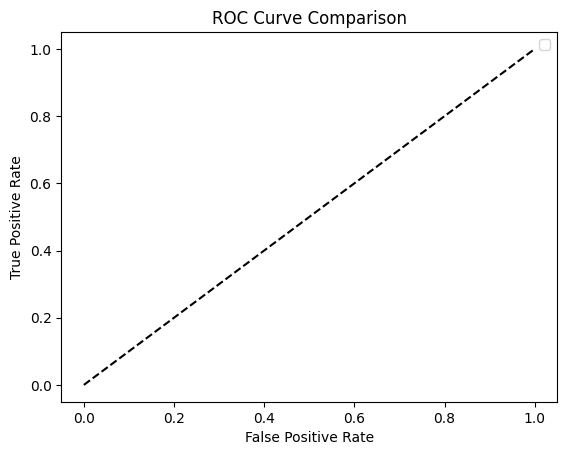

In [28]:
plt.plot([0,1], [0,1], 'k--')  # diagonal line

plt.title("ROC Curve Comparison")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.show()

In [29]:
print("\nFinal Model Accuracy Comparison:")
for model, acc in results.items():
    print(f"{model}: {acc:.4f}")


Final Model Accuracy Comparison:
Logistic Regression: 0.5859
Decision Tree: 0.9790
Random Forest: 0.9766


## Thank you..pls upvote!!!!!!!